[Example image containing text we want to detect using OCR](http://www.loc.gov/pictures/item/fsa1997003914/PP/)

[Example image containing text we want to detect using OCR](http://www.loc.gov/pictures/item/fsa1997003916/PP/)

[Example image containing text we want to detect using OCR](http://www.loc.gov/pictures/item/fsa1997003919/PP/)

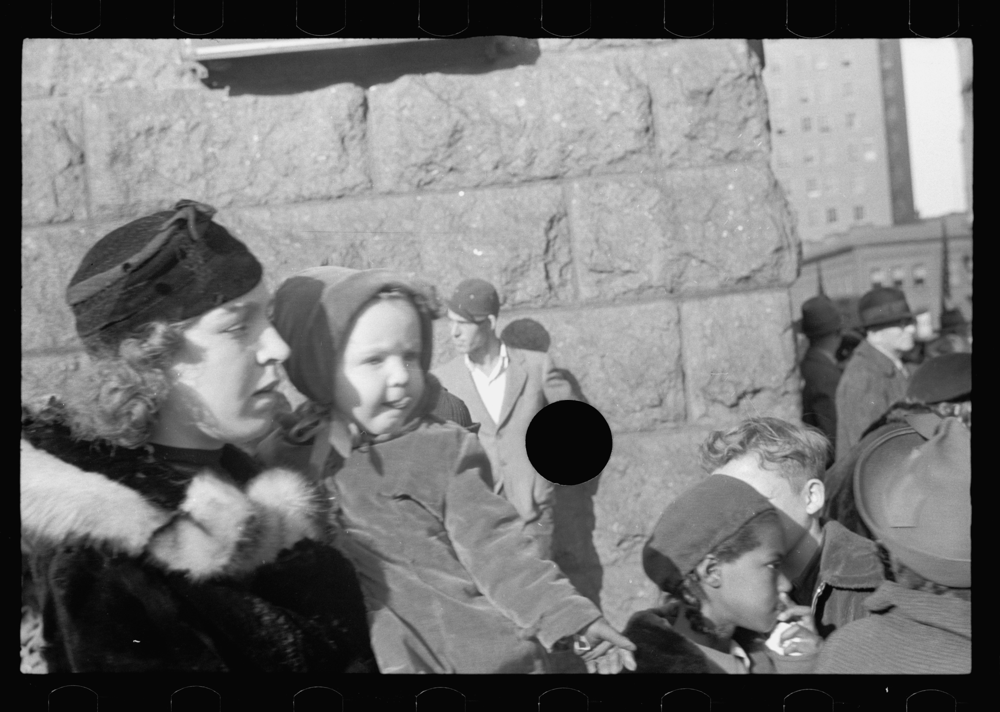

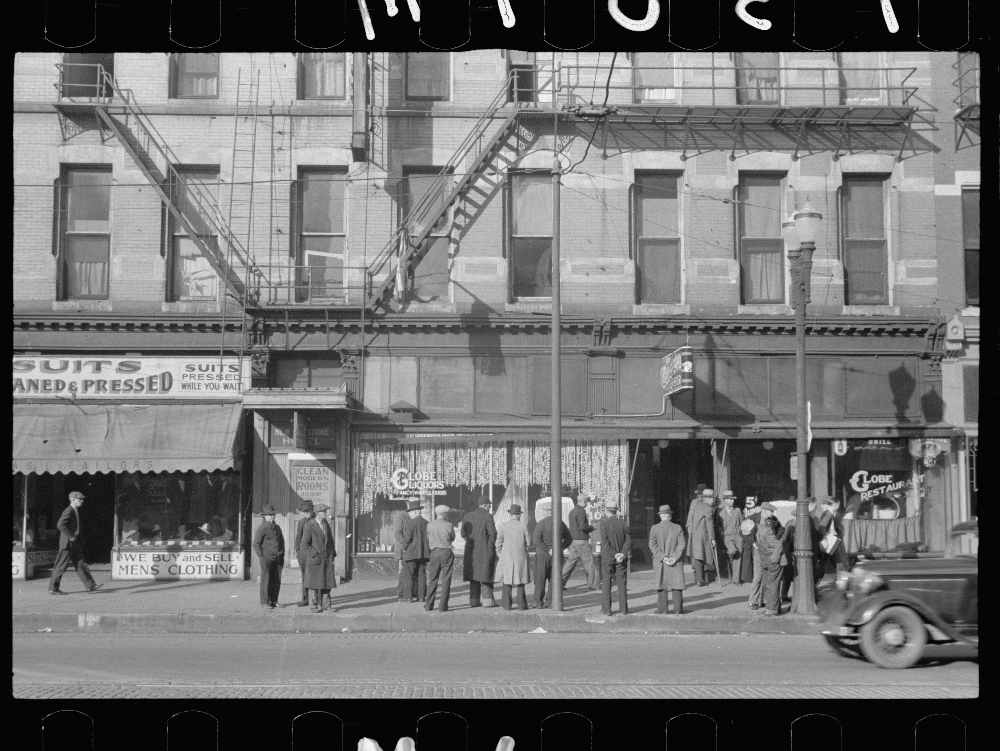

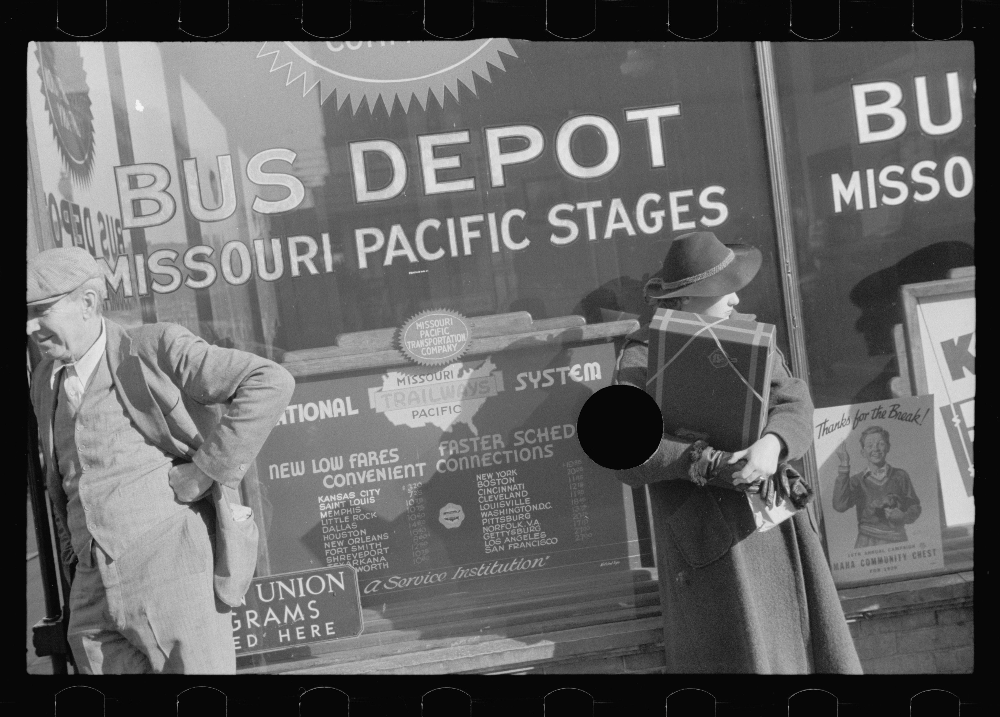

In [5]:
from IPython.display import Image as Img
from IPython.display import display as disp

disp(Img(filename='1997003914.jpg'))
disp(Img(filename='1997003916.jpg'))
disp(Img(filename='1997003919.jpg'))

In [4]:
#from PIL import Image
import Image
import pytesseract

infile="1997003919.jpg"
im=Image.open(infile)
#outfile="output.jpg"

rotations = range(-15,15+1,3)
for rot in rotations:
    out=im.rotate(rot)
#    out.save(outfile)
#    disp(Img(filename=outfile))
    zz = pytesseract.image_to_string(out)
    print("-"*10)
    print(str(rot))
    print(zz)


----------
-15

----------
-12
uoéfgtifﬁ
' .v. .
mp GETTYSBURG
IO"? , £3 ANGELES

 N FRANCISQ)
\
----------
-9
f’  EB SCHED

 
 
   
   
   
   
 

    
  

0 nnEC'nons

'~ NEW YORK
 I V : v  eosrou

pm - , - * CINCINNATI

é me ROC  CLEVELAND

- ' ’ DALLAS  LOUISVILLE

uousrou ,  wAsmuerounc.
:i  agar-we RT“ 4:40 Gerrvsaoés‘ ‘

   

     

ANGELES
AN FRANCISCO
----------
-6
ER SCHED
“HECTIOHS

NEW YORK

BOSTON

CINCINNATI

CLEVELAN 0

V _ LOUISVILLE

5 4‘ c;  WASH I NGTO N.D.C.
PITTSBURG
----------
-3

----------
0

----------
3

----------
6

----------
9

----------
12

----------
15



In [2]:
import findspark
import os
findspark.init()

import pyspark
sc = pyspark.SparkContext()

In [13]:
from cStringIO import StringIO
import time

def process_image_file_spark(something):
    
    image_data=StringIO(something[1])
    im=Image.open(image_data)
    
    rotations = range(-15,15+1,3)
    textfound=""
    for rot in rotations:
        out=im.rotate(rot)
        zz = pytesseract.image_to_string(out)
        textfound += zz

    return (something[0],textfound)

#imgfiles=sc.binaryFiles('hdfs://hdp:9000/pawel/day4/*.jpg')
#imgfiles=sc.binaryFiles('hdfs://localhost:9000/pawel/day4more/199700391*.jpg')
#imgfiles=sc.binaryFiles('hdfs://localhost:9000/pawel/day4more/19970039*.jpg')
imgfiles=sc.binaryFiles('hdfs://localhost:9000/pawel/day4more/1997003[6-9]*.jpg')


imgfiles.cache()

t0 = time.time()

output = imgfiles.map(process_image_file_spark)
images_ocr_data=output.collect()
print("results of text detection ",images_ocr_data)
t1 = time.time()
print('time is ',t1-t0, "for ", len(images_ocr_data), "images")

('results of text detection ', [(u'hdfs://localhost:9000/pawel/day4more/1997003601.jpg', '.. .m.\n\n xv: .. . ,.,, _.\n1 4.1%; 1\n\n. p .\nT. . x\nV . \xe2\x80\x98\nu 2\n\xe2\x80\x98 \xe2\x80\x98p . , \xef\xac\x82. )1;\n. V \xe2\x80\x98 Z.\n. .v V G , )\n. . a\xe2\x80\x98u\n. . Va,-\n.A .. V x ..,,\n,w \xc2\xbb .. 7 V\n, . A.'), (u'hdfs://localhost:9000/pawel/day4more/1997003605.jpg', ''), (u'hdfs://localhost:9000/pawel/day4more/1997003606.jpg', ''), (u'hdfs://localhost:9000/pawel/day4more/1997003607.jpg', '.\xe2\x80\x98i.It): bit\xc2\xbb. ,\n\n5.1.1 ,-.J\n4 L11'), (u'hdfs://localhost:9000/pawel/day4more/1997003609.jpg', ''), (u'hdfs://localhost:9000/pawel/day4more/1997003610.jpg', '. I J \xe2\x80\x9c VI "\nv5.0" wk\xc2\xbb.h\xe2\x80\x9du _\\ / \xc2\xab /._._.\xc2\xa5_\\9,-V. ..\n\nW.\xe2\x80\x94 ..n\xc2\xbb -\xe2\x80\x94-\xe2\x80\x94 ~.-\xc2\xab..~\xe2\x80\x94-\nWWW .\xc2\xbb \xe2\x80\x98m\xe2\x80\x99\n\na.. w- w v---\n~w WA\nW-v-\n\n....._........__..__...._.\n\xe2\x80\x98 m\xc2\xbb-

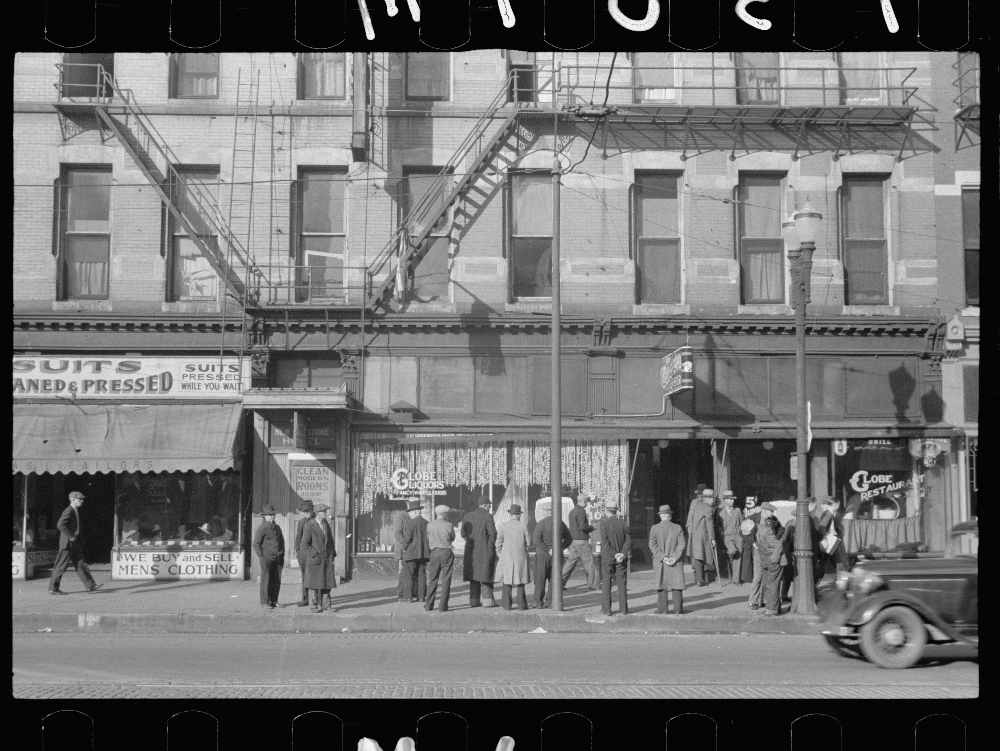

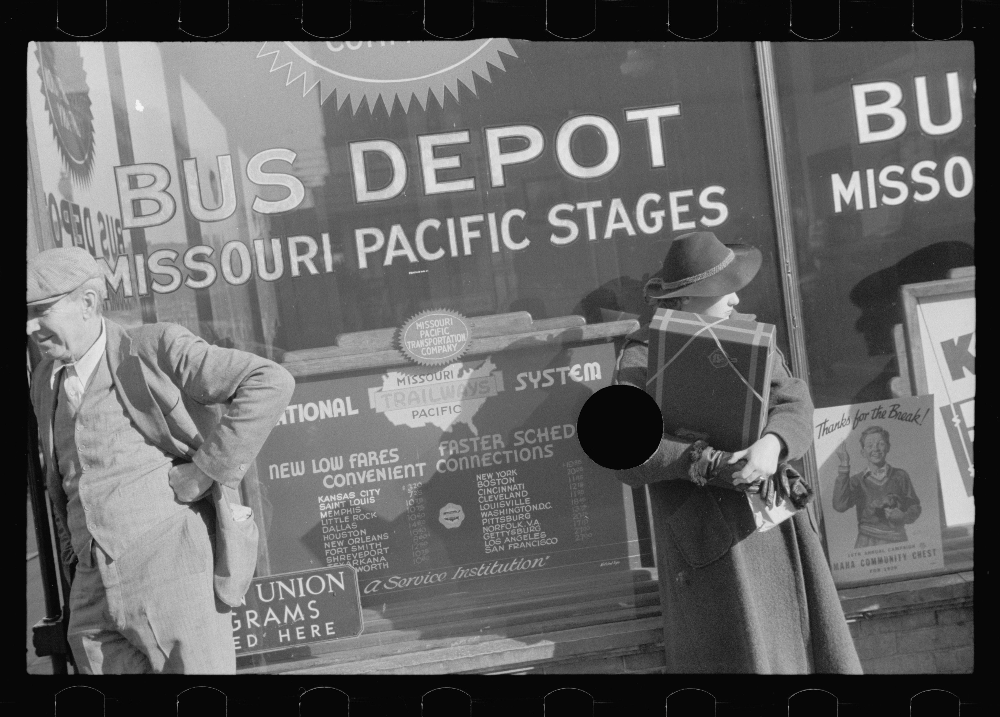

In [7]:
import subprocess
import os.path

for image_ocr in images_ocr_data:
    myfile=image_ocr[0]
    zz=subprocess.check_output("mkdir -p images_with_text",shell=True)

    output="images_with_text/"+myfile[-14:]
    if not os.path.isfile(output) :
        zz=subprocess.check_output("hdfs dfs -get "+myfile+" "+output,shell=True)

        # display only those images with text detected
    if(len(image_ocr[1])>0):
        disp(Img(filename="images_with_text/"+myfile[-14:]))
